In [1]:
import numpy as np

class GridWorld:
    def __init__(self):
        # Grid dimensions
        self.rows = 5
        self.cols = 5
        self.states = [(r, c) for r in range(self.rows) for c in range(self.cols)]
        # Define states
        self.obstacles = [(2, 2), (3, 2)]  # Obstacle states
        self.water = (4, 2)                # Water state
        self.goal = (4, 4)                 # Goal state
        
        # Define actions
        self.actions = ['AU', 'AD', 'AL', 'AR']  # Up, Down, Left, Right
        
        # Action probabilities
        self.p_intended = 0.8    # Probability of moving in intended direction
        self.p_side = 0.05      # Probability of veering left/right
        self.p_stay = 0.10      # Probability of staying in place
        
        # Current state
        self.current_state = (0, 0)  # Start at State 1
        
    def is_valid_state(self, state):
        """Check if state is valid (within bounds and not obstacle)"""
        r, c = state
        return (0 <= r < self.rows and 
                0 <= c < self.cols and 
                state not in self.obstacles)
    
    def get_next_state(self, state, action):
        """Get next state based on current state and action"""
        r, c = state
        
        # Define movement directions (up, down, left, right)
        movements = {
            'AU': (-1, 0),
            'AD': (1, 0),
            'AL': (0, -1),
            'AR': (0, 1)
        }
        
        # Get intended movement
        dr, dc = movements[action]
        new_r, new_c = r + dr, c + dc
        
        # Check if move is valid
        if self.is_valid_state((new_r, new_c)):
            return (new_r, new_c)
        return state  # Stay in current state if invalid move
    
    def step(self, action):
        """Take a step in the environment"""
        if action not in self.actions:
            raise ValueError("Invalid action")
            
        # Determine actual movement based on probabilities
        p = np.random.random()
        
        if p < self.p_stay:  # 10% chance to stay
            actual_action = None
        elif p < self.p_stay + self.p_intended:  # 80% chance for intended action
            actual_action = action
        else:  # 5% chance each for left/right deviation
            if action in ['AU', 'AD']:
                actual_action = 'AL' if p < 0.95 else 'AR'
            else:  # AL, AR
                actual_action = 'AU' if p < 0.95 else 'AD'
        
        # Update state
        if actual_action:
            self.current_state = self.get_next_state(self.current_state, actual_action)
        
        # Calculate reward
        reward = 10.0 if self.current_state == self.goal else -10.0 if self.current_state == self.water else 0.0
        
        # Check if episode is done
        done = self.current_state == self.goal
        
        return self.current_state, reward, done
    
    def reset(self):
        """Reset environment to initial state"""
        self.current_state = (0, 0)
        return self.current_state



In [10]:
import time
import copy
import matplotlib.pyplot as plt
class Node:
    def __init__(self, state, parent=None):
        self.state = state
        self.parent = parent
        self.children: List[Node] = []
        self.q_values = {} # Initialize as empty dict, not type hint
        self.visits = 0
        self.value = 0.0
        self.is_terminal = False
        self.tried_actions = []
        self.total_reward = 0

    def set_q_value(self, all_possible_actions, all_possible_states):
        for state in all_possible_states:
            self.q_values[state] = {}
            for action in all_possible_actions:
                self.q_values[state][action] = 0
    
    

class MonteCarloSearchTree:
    def __init__(self, env, gamma=0.95, epsilon=0.1):
        self.gamma = gamma
        self.epsilon = epsilon
        self.env = env  # Store environment reference
        state = (0,0)
        self.root = Node(state)
        self.root.set_q_value(env.actions, env.states)
        self.c = 100
        self.depth_limit = 100
        self.time_limit = 100
        
    def print_tree(self, node, depth=0):
        print("-" * depth + str(node.state))
        for child in node.children:
            self.print_tree(child, depth + 1)

    def _select(self, node):
        """Select a node to expand using UCT."""
        current = node
        while len(current.children) > 0:
            if len(current.tried_actions) < len(self.env.actions):
                return current
            
            # UCT formula: Q(s,a) + c * sqrt(ln(N(s))/N(s,a))
            children_values = [
                (child, 
                 child.value + self.c * np.sqrt(np.log(current.visits) / (child.visits + 1e-10)))
                for child in current.children
            ]
            current = self.best_child(current)
        return current

    def best_child(self, node):
        return max(node.children, key=lambda x: x.value)
    
    def _expand(self, node, env):
        """Expand node by trying untried actions."""
        for action in env.actions:
            if action not in node.tried_actions:
                next_state, reward, done = self.step(node.state, action, env)
                child = Node(next_state, parent=node)
                child.set_q_value(env.actions, env.states)  # Initialize q_values for new node
                node.children.append(child)
                node.tried_actions.append(action)

    def _rollout(self, node):
        """Perform random rollout from node."""
        current_state = node.state
        cumulative_reward = 0
        depth = 0
        temp_env = copy.deepcopy(self.env)
        temp_env.current_state = current_state
        
        while not temp_env.current_state == temp_env.goal and depth < self.depth_limit:  # Depth limit
            action = np.random.choice(temp_env.actions)
            _, reward, done = temp_env.step(action)
            cumulative_reward += (self.gamma ** depth) * reward
            depth += 1
            if done:
                break
                
        return cumulative_reward

    def _backpropagate(self, node, reward):
        """Backpropagate the reward through the tree."""
        current = node
        while current is not None:
            current.visits += 1
            # Calculate average reward instead of cumulative
            current.total_reward = ((current.visits - 1) * current.total_reward + reward) / current.visits
            current.value = current.total_reward
            
            # Update Q-values if parent exists
            if current.parent is not None:
                action = self._get_action_taken(current.parent, current)
                if action is not None:  # Only update if valid action found
                    parent_state = current.parent.state
                    if parent_state in current.parent.q_values:  # Check if state exists
                        if action in current.parent.q_values[parent_state]:  # Check if action exists
                            current.parent.q_values[parent_state][action] = current.value
                
            current = current.parent
            reward *= self.gamma  # Discount the reward as we go up

    def _get_action_taken(self, parent, child):
        """Helper to determine what action led from parent to child."""
        for action in self.env.actions:
            next_state, _, _ = self.step(parent.state, action, self.env)
            if next_state == child.state:
                return action
        return None
    
    def tree_search(self, node) -> any:
        start_time = time.time()
        # fig, ax = plt.subplots()
        iteration = 0
        plottingmaterials = []
        while time.time() - start_time < self.time_limit:
            
            # print("Selecting node")
            selected_node = self._select(node)
            if selected_node.is_terminal:
                # print("Terminal node reached")
                pass
            if not selected_node.is_terminal and len(selected_node.tried_actions) < len(self.env.actions):
                # print("Expanding node")
                self._expand(selected_node, self.env)
                if len(selected_node.children) > 0:  # Only proceed if expansion successful
                    # print("Expanding node successful")
                    # Choose a random child node instead of always taking the last one
                    # selected_node = random.choice(selected_node.children)
                    # print("Rolling out")    
                    reward = self._rollout(selected_node)
                    # print(f"Reward: {reward}")
                    # print("Backpropagating")
                    self._backpropagate(selected_node, reward)
            
            # plot here
            avg_reward,min_reward,max_reward = self.find_stats_reward(self.root)
            time_taken = time.time() - start_time
            plottingmaterials.append((time_taken, avg_reward,min_reward,max_reward))
            

            # self.plt_time_vs_reward(time.time() - start_time, ax, fig)
            if iteration % 1000 == 0:
                print(f"Iteration {iteration}")
                print(f"Average Reward: {avg_reward}")
                print(f"Min Reward: {min_reward}")
                print(f"Max Reward: {max_reward}")
            iteration += 1
        
        return plottingmaterials

    def find_stats_reward(self,root):
        if root.children:
            return sum(node.total_reward for node in root.children) / len(root.children),min(node.total_reward for node in root.children),max(node.total_reward for node in root.children)
        else:
            return 0,0,0
    def step(self, state, action,env):
        next_state, reward, done = env.step(action)
        return next_state, reward, done
    
    def plt_time_vs_reward(self, time_taken, ax, fig):
        # plot it dynamically in run time
        # Store time and reward data points
        if not hasattr(self, 'times'):
            self.times = []
            self.rewards = []
        
        avg_reward = sum(node.total_reward for node in self.root.children) / len(self.root.children) if self.root.children else 0
        self.times.append(time_taken)
        self.rewards.append(avg_reward)
        
        # Clear previous plot
        ax.clear()
        
        # Plot all data points
        ax.plot(self.times, self.rewards)
        ax.set_xlabel('Time taken')
        ax.set_ylabel('Average Reward')
        ax.set_title('Time vs Average Reward')
        
        # Update plot
        plt.pause(0.001)  # Small pause to allow plot to update


In [13]:
env = GridWorld()
mcts = MonteCarloSearchTree(env)
mcts.c = 100
mcts.depth_limit = 20
mcts.time_limit = 100
mcts.gamma = 0.95
plottingmaterials = mcts.tree_search(mcts.root)
#find optimal policy
optimal_policy = {state: max(mcts.root.q_values[state], key=lambda a: mcts.root.q_values[state][a]) for state in mcts.root.q_values}
optimal_values = {state: max(mcts.root.q_values[state].values()) for state in mcts.root.q_values}

#print tree

# print policy in table with arrows
def print_policy(policy):
    for i in range(5):
        for j in range(5):
            state = (i, j)
            if state is env.goal:
                print("G", end=" ")
                continue
            elif state in env.obstacles:
                print("O", end=" ")
                continue
            action = policy[state]
            if action == 'AU':
                print("↑", end=" ")
            elif action == 'AD':
                print("↓", end=" ")
            elif action == 'AL':
                print("←", end=" ")
            elif action == 'AR':
                print("→", end=" ")
            else:
                print(" ", end=" ")
        print()

def print_values(values):
    for i in range(5):
        for j in range(5):
            state = (i, j)
            if state is env.goal:
                print("0.00", end=" ")
                continue
            elif state in env.obstacles:
                print("0.00", end=" ")
                continue
            print(f"{values[state]:.2f}", end=" ")
        print()
print_policy(optimal_policy)
print_values(optimal_values)
mcts.print_tree(mcts.root)

Iteration 0
Average Reward: 0.0
Min Reward: 0
Max Reward: 0
Iteration 1000
Average Reward: -1.2102285582179761
Min Reward: -2.667766643771749
Max Reward: -0.05292049415536111
Iteration 2000
Average Reward: -1.2372323330752089
Min Reward: -2.667766643771749
Max Reward: -0.16093559358429127
Iteration 3000
Average Reward: -1.2350123793107188
Min Reward: -2.667766643771749
Max Reward: -0.1520557785263315
Iteration 4000
Average Reward: -1.2415513277196535
Min Reward: -2.667766643771749
Max Reward: -0.17821157216206956
Iteration 5000
Average Reward: -1.2395732760189055
Min Reward: -2.667766643771749
Max Reward: -0.1702993653590785
Iteration 6000
Average Reward: -1.2378799740928865
Min Reward: -2.667766643771749
Max Reward: -0.1635261576550022
Iteration 7000
Average Reward: -1.232988014185882
Min Reward: -2.667766643771749
Max Reward: -0.1439583180269838
Iteration 8000
Average Reward: -1.2338824646426985
Min Reward: -2.667766643771749
Max Reward: -0.14753611985425016
Iteration 9000
Average Re

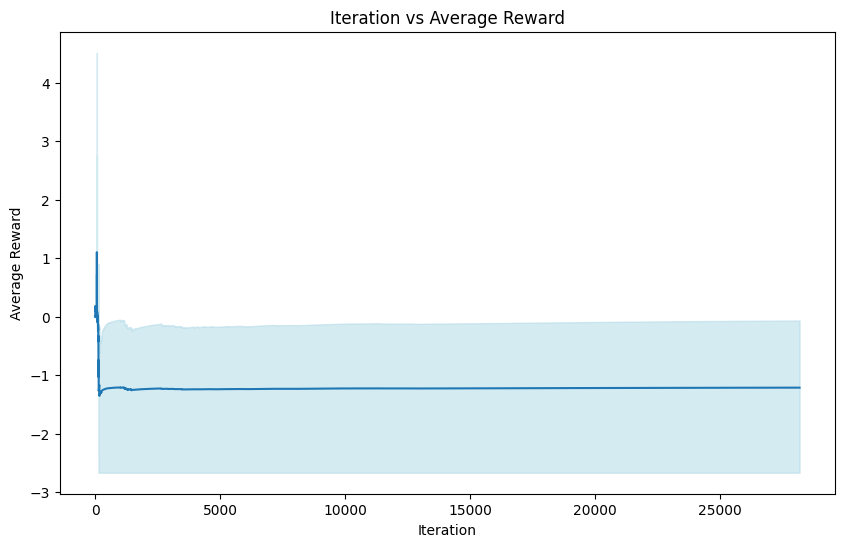

In [15]:
#plot the time vs reward
#plot in log scale iteration
plt.figure(figsize=(10, 6))
x_values = [i for i in range(len(plottingmaterials))]
y_values = [x[1] for x in plottingmaterials]
#plot min and max reward as a shaded area light blue
plt.fill_between(x_values, [x[2] for x in plottingmaterials], [x[3] for x in plottingmaterials], color='lightblue', alpha=0.5)
plt.plot(x_values, y_values)
plt.xlabel('Iteration')
plt.ylabel('Average Reward')
plt.title('Iteration vs Average Reward')
# plt.xscale('log')
# plt.yscale('log')
plt.show()